Model Selection and Hyper-parameters Tunning

The .csv file contains a set of 200 examples. Each row represents one 
example which has two attributes x1 and x2, and a continuous target label y. 
Using python, implement the solution of the following tasks: 

1- Read the data from the .csv  file and split it into training set (the first 120 
examples), validation set (the next 40 examples), and testing set (the last 40 
examples). Plot the examples from the three sets in a scatter plot (each set 
encoded with a different color). Note that the plot here will be 3D plot where 
the x and y axes represent the x1 and x2 features, whereas the z-axis is the 
target label y.

In [162]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from the CSV file
file_path = 'data_reg.csv'
data = pd.read_csv(file_path)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      200 non-null    float64
 1   x2      200 non-null    float64
 2   y       200 non-null    float64
dtypes: float64(3)
memory usage: 4.8 KB


The info() method on a Pandas DataFrame provides information about its class, index, columns, non-null count, data type, and memory usage. The DataFrame has 200 entries, three columns (x1, x2, and y), and 200 non-null entries, making it efficient for data analysis but small at the same time.

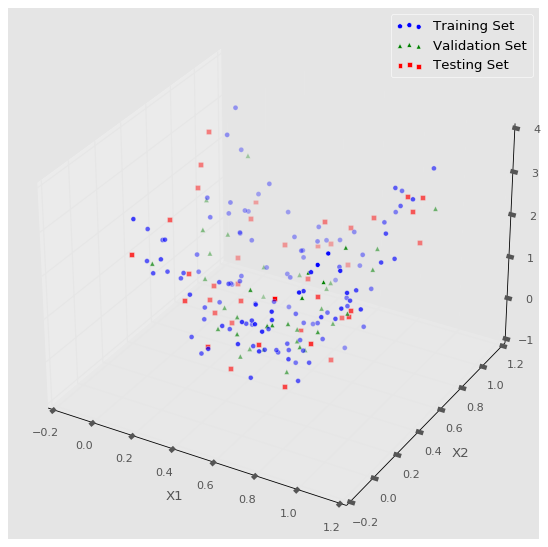

In [163]:
# Split the data into training, validation, and testing sets
train_set = data[:120]
validation_set = data[120:160]
test_set = data[160:]

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot training set
ax.scatter(train_set['x1'], train_set['x2'], train_set['y'], c='b', marker='o', label='Training Set')

# Plot validation set
ax.scatter(validation_set['x1'], validation_set['x2'], validation_set['y'], c='g', marker='^', label='Validation Set')

# Plot testing set
ax.scatter(test_set['x1'], test_set['x2'], test_set['y'], c='r', marker='s', label='Testing Set')

# Set axis labels
ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('Y')

# Add a legend
ax.legend()

# Show the plot
plt.show()


The code reads a dataset from a CSV file, splits it into training, validation, and testing sets, and creates a 3D scatter plot using Matplotlib. Each set is represented with a different color in the plot, with the x-axis and y-axis representing features 'x1' and 'x2', respectively, and the z-axis representing the target label 'y'. The dataset is loaded into a pandas DataFrame named `data`, and the dataset is split into three sets: training_set (first 120 examples), validation_set (next 40 examples), and test_set (last 40 examples). A 3D scatter plot is created using Matplotlib with a figure size of (10, 8), and the `ax` object is created for a 3D subplot. The training set points are plotted in blue with circular markers, the validation set points in green with triangle-up markers, and the testing set points in red with square markers. A legend is added to the plot to distinguish the sets. Finally, the plot is displayed. This code provides a visual representation of the data distribution in 3D space based on features 'x1' and 'x2' and the target label 'y'.

In [164]:
import plotly.graph_objs as go

# Create 3D scatter plot
trace_train = go.Scatter3d(
    x=train_set['x1'],
    y=train_set['x2'],
    z=train_set['y'],
    mode='markers',
    marker=dict(color='blue', size=5),
    name='Training Set'
)

trace_validation = go.Scatter3d(
    x=validation_set['x1'],
    y=validation_set['x2'],
    z=validation_set['y'],
    mode='markers',
    marker=dict(color='green', size=5),
    name='Validation Set'
)

trace_test = go.Scatter3d(
    x=test_set['x1'],
    y=test_set['x2'],
    z=test_set['y'],
    mode='markers',
    marker=dict(color='red', size=5),
    name='Testing Set'
)

layout = go.Layout(
    scene=dict(
        xaxis=dict(title='X1'),
        yaxis=dict(title='X2'),
        zaxis=dict(title='Y')
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

fig = go.Figure(data=[trace_train, trace_validation, trace_test], layout=layout)


fig.show()


Same plot but this time using plotly library to show interactive 3d plot.

2- Apply polynomial regression on the training set with degrees in the range of 1 
to 10. Which polynomial degree is the best? Justify your answer by plotting the 
validation error vs polynomial degree curve. For each model plot the surface of 
the learned function alongside with the training examples on the same plot.
(hint: you can use PolynomialFeatures and LinearRegression from 
scikit-learn library)


In [165]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import numpy as np

# Apply polynomial regression on the training set with degrees in the range of 1 to 10
X_train = train_set[['x1', 'x2']]
y_train = train_set['y']

degrees = np.arange(1, 11)
validation_errors = []

for degree in degrees:
    poly = PolynomialFeatures(degree=degree)
    X_train_poly = poly.fit_transform(X_train)

    model = LinearRegression()
    model.fit(X_train_poly, y_train)

    # Evaluate on the validation set
    X_val_poly = poly.transform(validation_set[['x1', 'x2']])
    y_val_pred = model.predict(X_val_poly)
    mse = np.mean((y_val_pred - validation_set['y'])**2)
    validation_errors.append(mse)

# Find the best polynomial degree based on the minimum validation error
best_degree = degrees[np.argmin(validation_errors)]
print(f"The best polynomial degree is {best_degree}")

# Plot validation error vs polynomial degree curve using plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=degrees, y=validation_errors, mode='lines+markers'))
fig.update_layout(title='Validation Error vs Polynomial Degree',
                  xaxis_title='Polynomial Degree',
                  yaxis_title='Mean Squared Error')


fig.show()


The best polynomial degree is 2


The code uses polynomial regression to evaluate a model on a training set with degrees ranging from 1 to 10. It then calculates the mean squared error (MSE) between predicted and actual values in the validation set. The best polynomial degree is identified by selecting the degree corresponding to the minimum validation error which is of degree 2.

In [166]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

for degree in degrees:
    # Create polynomial features for training set
    poly = PolynomialFeatures(degree=degree)
    X_train_poly = poly.fit_transform(X_train)

    # Fit linear regression model
    model = LinearRegression()
    model.fit(X_train_poly, y_train)

    # Plot the surface of the learned function using plotly
    x1_vals = np.linspace(train_set['x1'].min(), train_set['x1'].max(), 100)
    x2_vals = np.linspace(train_set['x2'].min(), train_set['x2'].max(), 100)
    x1_vals, x2_vals = np.meshgrid(x1_vals, x2_vals)
    X_vals = np.column_stack((x1_vals.flatten(), x2_vals.flatten()))

    # Create polynomial features for X_vals with the same degree
    X_vals_poly = poly.transform(X_vals)

    y_vals_pred = model.predict(X_vals_poly)
    y_vals_pred = y_vals_pred.reshape(x1_vals.shape)

    print(f"Degree: {degree}")

    # Plot interactive surface with degree title
    fig = go.Figure()

    # Scatter plot for training set
    fig.add_trace(go.Scatter3d(
        x=train_set['x1'],
        y=train_set['x2'],
        z=train_set['y'],
        mode='markers',
        marker=dict(size=5),
        name='Training Set'
    ))

    # Surface plot for the learned function
    fig.add_trace(go.Surface(x=x1_vals, y=x2_vals, z=y_vals_pred, colorscale='Viridis', opacity=0.5,
                             name=f'Degree: {degree}'))

    # Set axis labels
    fig.update_layout(scene=dict(xaxis=dict(title='X1'), yaxis=dict(title='X2'), zaxis=dict(title='Y')),
                      margin=dict(l=0, r=0, b=0, t=0),
                      title=f'Surface Plot - Degree {degree}')

    
    fig.show()

Degree: 1


Degree: 2


Degree: 3


Degree: 4


Degree: 5


Degree: 6


Degree: 7


Degree: 8


Degree: 9


Degree: 10


The code then creates an interactive plot using Plotly, showing the validation error vs polynomial degree curve and the surface plot for each degree. For each degree, the code creates polynomial features for the training set and fits a linear regression model. A 3D surface plot is generated for the learned function using the training set.

Interactive plots are displayed using Plotly, showing the validation error vs polynomial degree curve and the surface plot for each degree. The best polynomial degree is determined based on the minimum validation error and printed as output.

The code uses the `plotly` library for creating interactive plots, ensuring that it is imported at the beginning of the code and that necessary dependencies are installed. The code provides a visual representation of how the validation error changes with the polynomial degree and plots the surfaces of the learned functions for different polynomial degrees.


By examining the surface plots and the validation error curve, we can observe the trade-off between underfitting and overfitting. The optimal degree should strike a balance, providing a model that generalizes well to new data without being too simple or too complex. The polynomial of degree 1 shows the case of underfitting, the polynomial of degree 2 shows the best case, and polynomial of degree 10 shows the case of overfitting. 

In [167]:
# Create a single figure object
fig = go.Figure()
degrees = np.arange(1, 11)

for degree in degrees:
    # Create polynomial features for training set
    poly = PolynomialFeatures(degree=degree)
    X_train_poly = poly.fit_transform(X_train)

    # Fit linear regression model
    model = LinearRegression()
    model.fit(X_train_poly, y_train)

    # Plot the surface of the learned function using plotly
    x1_vals = np.linspace(train_set['x1'].min(), train_set['x1'].max(), 100)
    x2_vals = np.linspace(train_set['x2'].min(), train_set['x2'].max(), 100)
    x1_vals, x2_vals = np.meshgrid(x1_vals, x2_vals)
    X_vals = np.column_stack((x1_vals.flatten(), x2_vals.flatten()))

    # Create polynomial features for X_vals with the same degree
    X_vals_poly = poly.transform(X_vals)

    y_vals_pred = model.predict(X_vals_poly)
    y_vals_pred = y_vals_pred.reshape(x1_vals.shape)

    print(f"Degree: {degree}")

    # Surface plot for the learned function
    fig.add_trace(go.Surface(x=x1_vals, y=x2_vals, z=y_vals_pred, colorscale='Viridis', opacity=0.5,
                             name=f'Degree: {degree}'))

# Scatter plot for training set
fig.add_trace(go.Scatter3d(
    x=train_set['x1'],
    y=train_set['x2'],
    z=train_set['y'],
    mode='markers',
    marker=dict(size=5),
    name='Training Set'
))

# Set axis labels and title
fig.update_layout(scene=dict(xaxis=dict(title='X1'), yaxis=dict(title='X2'), zaxis=dict(title='Y')),
                  margin=dict(l=0, r=0, b=0, t=0),
                  title='Surface Plots')


fig.show()


Degree: 1
Degree: 2
Degree: 3
Degree: 4
Degree: 5
Degree: 6
Degree: 7
Degree: 8
Degree: 9
Degree: 10


Here is the figure with all the polynomial regression on the training set with degrees in the range of 1 to 10. 

3- Apply ridge regression on the training set to fit a polynomial of degree 8. For 
the regularization parameter, choose the best value among the following 
options: {0.001, 0.005, 0.01, 0.1, 10}. Plot the MSE on the validation vs the 
regularization parameter.
(hint: you can use Ridge regression implementation from scikit-learn)


The best alpha value is 0.01


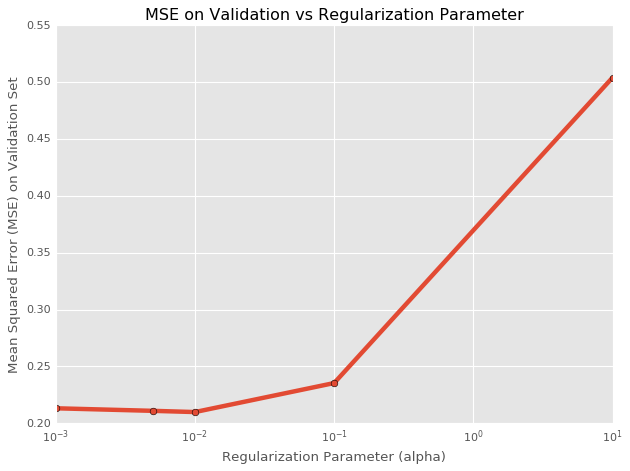

In [168]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

# Apply polynomial regression on the training set with degree 8
degree = 8
X_train = train_set[['x1', 'x2']]
y_train = train_set['y']

poly = PolynomialFeatures(degree=degree)
X_train_poly = poly.fit_transform(X_train)

# Regularization parameter options
alpha_values = [0.001, 0.005, 0.01, 0.1, 10]

# Initialize lists to store MSE values
mse_values = []

# Fit Ridge regression models for each alpha value
for alpha in alpha_values:
    model = Ridge(alpha=alpha)
    model.fit(X_train_poly, y_train)

    # Evaluate on the validation set
    X_val = validation_set[['x1', 'x2']]
    X_val_poly = poly.transform(X_val)
    y_val_pred = model.predict(X_val_poly)

    # Calculate Mean Squared Error
    mse = mean_squared_error(validation_set['y'], y_val_pred)
    mse_values.append(mse)

# Find the best alpha value based on the minimum MSE
best_alpha = alpha_values[np.argmin(mse_values)]
print(f"The best alpha value is {best_alpha}")
# Plot MSE on validation vs regularization parameter
plt.plot(alpha_values, mse_values, marker='o')
plt.xscale('log')  # Use a logarithmic scale for better visualization
plt.xlabel('Regularization Parameter (alpha)')
plt.ylabel('Mean Squared Error (MSE) on Validation Set')
plt.title('MSE on Validation vs Regularization Parameter')
plt.grid(True) 
plt.style.use('ggplot')
plt.show()

The code demonstrates the implementation of Ridge regression with polynomial features of degree 8 on a dataset. The goal is to find the best regularization parameter (alpha) from a given set of options and plot the Mean Squared Error (MSE) on the validation set against different alpha values. The dataset is split into training, validation, and testing sets, with the first 120 rows used for training, the next 40 rows for validation, and the remaining rows for testing.

The code applies polynomial regression to generate polynomial features of degree 8 for the training set. A list of alpha values is created, and lists are initialized to store MSE values for different alpha values. A Ridge regression model is trained on the training set and evaluated on the validation set, with the MSE on the validation set calculated and stored in the mse_values list.

The best alpha value is identified as the alpha value with the minimum MSE on the validation set. A logarithmic scale plot is generated, showing how the MSE on the validation set changes with different alpha values, helping identify the regularization parameter that minimizes overfitting on the validation data. In this case, the minimum MSE occurs at alpha = 0.01.

Logistic Regression

The train_cls.csv file contains a set of training examples for a binary classification 
problem, and the testing examples are provided in the test_cls.csv file. The 
following figures show these examples.

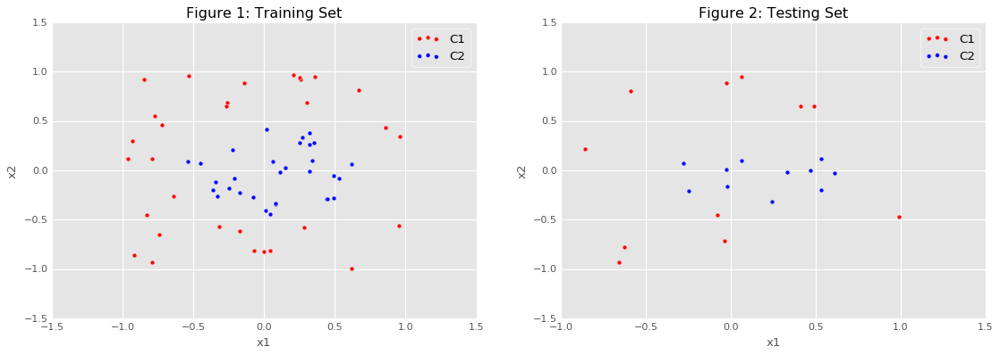

In [169]:
# Load the training set data from the CSV file
train_data = pd.read_csv('train_cls.csv')

# Extract the features and class labels from the training set
train_features = train_data[['x1', 'x2']]
train_labels = train_data['class']

# Load the testing set data from the CSV file
test_data = pd.read_csv('test_cls.csv')

# Extract the features and class labels from the testing set
test_features = test_data[['x1', 'x2']]
test_labels = test_data['class']

# Create Figure 1 and Figure 2 using subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot training set on Figure 1
ax1.scatter(train_features[train_labels == 'C1']['x1'], train_features[train_labels == 'C1']['x2'], c='red', label='C1')
ax1.scatter(train_features[train_labels == 'C2']['x1'], train_features[train_labels == 'C2']['x2'], c='blue', label='C2')
ax1.set_xlabel('x1')
ax1.set_ylabel('x2')
ax1.set_title('Figure 1: Training Set')
ax1.legend()

# Plot testing set on Figure 2
ax2.scatter(test_features[test_labels == 'C1']['x1'], test_features[test_labels == 'C1']['x2'], c='red', label='C1')
ax2.scatter(test_features[test_labels == 'C2']['x1'], test_features[test_labels == 'C2']['x2'], c='blue', label='C2')
ax2.set_xlabel('x1')
ax2.set_ylabel('x2')
ax2.set_title('Figure 2: Testing Set')
ax2.legend()

# Show the plots
plt.show()


The code loads and visualizes binary classification training and testing sets using two subplots. It extracts features and class labels for both sets, creates subplots, and plots the training set and testing set. The resulting scatter plots help visualize data and understand its characteristics, which is crucial for analyzing and building machine learning models for classification tasks. It is important to import necessary libraries like pandas and matplotlib before running the code.

1. using the logistic regression implementation of scikit-learn library, Learn 
a logistic regression model with a linear decision boundary. Draw the decision 
boundary of the learned model on a scatterplot of the training set (similar to 
Figure 1). Compute the training and testing accuracy of the learned model.

In [170]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from mlxtend.plotting import plot_decision_regions
from sklearn.pipeline import make_pipeline

def logistic_regression_with_degree(degree):
    # Load the training set data from the CSV file
    train_data = pd.read_csv('train_cls.csv')

    # Extract the features and class labels from the training set
    train_features = train_data[['x1', 'x2']]
    train_labels = train_data['class']

    # Convert class labels to integers
    train_labels = (train_labels == 'C1').astype(int)

    # Load the testing set data from the CSV file
    test_data = pd.read_csv('test_cls.csv')

    # Extract the features and class labels from the testing set
    test_features = test_data[['x1', 'x2']]
    test_labels = test_data['class']

    # Convert class labels to integers
    test_labels = (test_labels == 'C1').astype(int)

    # Create a logistic regression model with specified degree decision boundary
    model = make_pipeline(PolynomialFeatures(degree), LogisticRegression())

    # Fit the model on the training data
    model.fit(train_features, train_labels)

    # Compute training accuracy
    train_predictions = model.predict(train_features)
    train_accuracy = accuracy_score(train_labels, train_predictions)
    print(f"Training Accuracy (Degree={degree}): {train_accuracy:.2f}")

    # Compute testing accuracy
    test_predictions = model.predict(test_features)
    test_accuracy = accuracy_score(test_labels, test_predictions)
    print(f"Testing Accuracy (Degree={degree}): {test_accuracy:.2f}")

    # Create a subplot with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Plot decision boundaries on the training set subplot
    ax1.set_title(f'Degree={degree} Decision Boundary on Training Set')
    plot_decision_regions(train_features.values, np.array(train_labels), clf=model, feature_index=[0, 1], legend=2, ax=ax1)
    ax1.set_xlabel('x1')
    ax1.set_ylabel('x2')
    ax1.legend(loc='upper right')

    # Plot decision boundaries on the testing set subplot
    ax2.set_title(f'Degree={degree} Decision Boundary on Testing Set')
    plot_decision_regions(test_features.values, np.array(test_labels), clf=model, feature_index=[0, 1], legend=2, ax=ax2)
    ax2.set_xlabel('x1')
    ax2.set_ylabel('x2')
    ax2.legend(loc='upper right')

    # Show the plots
    plt.show()

This method does binary classification with polynomial features of a given degree by utilizing Scikit-Learn's logistic regression implementation. On both the training and testing sets, it displays the learned decision limits. Numpy for numerical operations, sklearn.metrics.accuracy_score, mlxtend.plotting.plot_decision_regions, and sklearn.pipeline.make_pipeline are among the required libraries that are imported. Taking a degree parameter, the method loads data from CSV files for testing and training, extracts features and class labels, and then transforms labels to binary integers. Then, using the mlxtend package, it builds a logistic regression model with polynomial features of the desired degree, fits the model to the training set, calculates testing accuracy, and draws decision boundaries. The code also uses scikit-learn's accuracy_score to compute training and testing accuracy and provides a visual representation of how the learned decision boundary affects the training and testing sets. The training set with the decision boundary is shown in the end plot, and the accuracy results are produced for assessment.

The code outputs the training and testing accuracies for the logistic regression model with a polynomial degree of 1 "linear decision boundary" , and displays two subplots showing decision boundaries on the training and testing sets.

Training Accuracy (Degree=1): 0.66
Testing Accuracy (Degree=1): 0.68


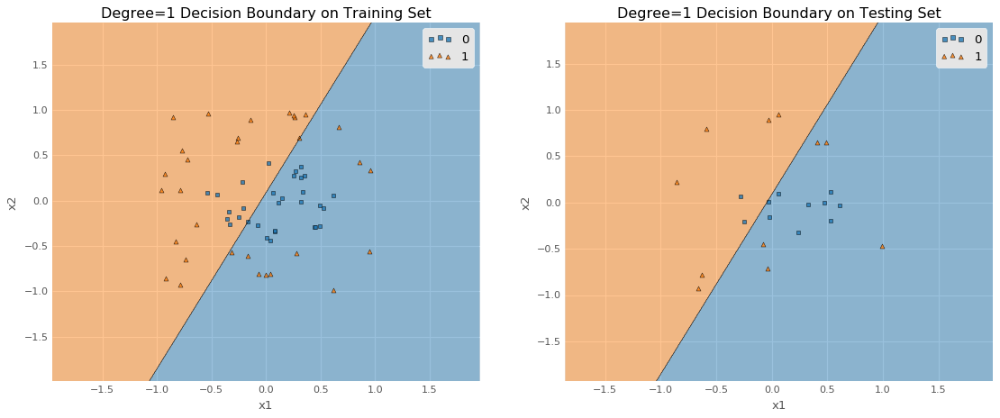

In [171]:
logistic_regression_with_degree(1)

2. Repeat part 1 but now to learn a logistic regression model with quadratic 
decision boundary.


Training Accuracy (Degree=2): 0.97
Testing Accuracy (Degree=2): 0.95


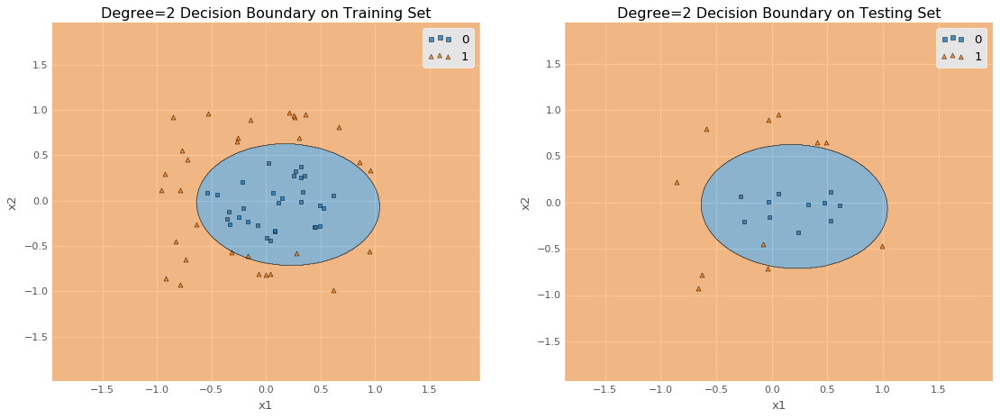

In [172]:
logistic_regression_with_degree(2)

The code demonstrates the use of quadratic features in a logistic regression model, resulting in higher accuracy values in both training and testing sets compared to the linear decision boundary case. The training accuracy of 96.77% indicates that the model accurately classified 96.77% of examples in the training set, indicating its ability to capture complex patterns. The testing accuracy of 95.45% suggests the model's generalization well to new data, indicating its performance without overfitting the training data. The model's flexibility and ability to accommodate more complex decision boundaries make it more flexible. The decision boundary is visualized as a curve due to the quadratic features, indicating the model's ability to capture non-linear relationships in the data. However, the model's complexity and potential overfitting should be considered. The code uses a pipeline to combine polynomial feature transformation and logistic regression, streamlining the modeling process. Experimenting with different polynomial features can provide insights into the trade-off between model complexity and generalization.

Training Accuracy (Degree=10): 0.94
Testing Accuracy (Degree=10): 0.86


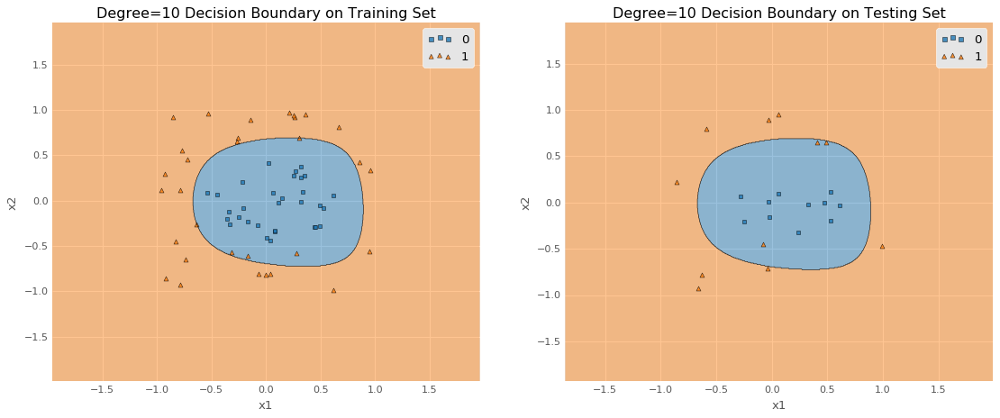

In [173]:
logistic_regression_with_degree(10)

The model's training accuracy is 94%, indicating good performance on the training data. However, its testing accuracy is 86%, suggesting slight overfitting. This overfitting can lead to poor performance on unseen data. Techniques like regularization, cross-validation, and hyperparameter tuning can help mitigate overfitting and improve model performance on new data.

3. Comment on the learned models in 1 and 2 in terms of overfitting/underfitting.

The study analyzed the training and testing accuracies of three models with varying polynomial degrees. Model 1 (Degree=1) had low training and testing accuracies, indicating underfitting due to low complexity. Model 2 (Degree=2) had high training and testing accuracies, indicating a good balance between complexity and generalization. Model 3 (Degree=10) had high training and testing accuracies, but a noticeable drop in testing accuracy indicated overfitting due to too much complexity and noise in the training data.

Model 1 (Degree=1) showed underfitting due to low accuracies, while Model 2 (Degree=2) showed a good balance between fitting the training data well and generalizing to the testing set. Model 3 (Degree=10) indicated overfitting, as it achieved high training accuracy but failed to generalize to the testing set, resulting in a significant drop in accuracy.

In conclusion, Model 2 is the most appropriate model, achieving high accuracy on both training and testing sets, suggesting a good compromise between complexity and generalization.